Student name: Rashawn Wilkinson


Student pace: Full time


Scheduled project review date/time:4.28.20


Instructor name: Abhineet Kulkarni


Blog post URL: https://medium.com/@blkzen/an-introduction-to-great-models-28ab46ae4df9

# CD Predictor Models

The focus of my **cardiovascular predictor models** are to calculate the likelihood of getting heart disease.

## Library & Data Input

In [1]:
#To do this, we will first input packages and specific functions that may be useful to our model.
import numpy as np
import pandas as pd
from matplotlib import pyplot
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt
import math
%matplotlib inline
import seaborn as sns
import scipy.stats as stats
from sklearn import linear_model
from sklearn.linear_model import LinearRegression as linreg
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score 
from sklearn.metrics import classification_report 
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn import feature_selection
from sklearn.model_selection import KFold
from sklearn.datasets import make_classification
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import nltk
import xgboost as xgb
#import pandas_profiling as pp
#from sklearn.metrics import mean_squared_error
#import tkinter as tk 
#from dateutil.parser import parse

df = pd.read_csv('cardio_train.csv', sep=';')

C:\ProgramData\Anaconda3\envs\learn-env\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
df = pd.DataFrame(df)
df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


### Features and Target

*Features*

Age | Objective Feature | age | int (days)

Height | Objective Feature | height | int (cm) |

Weight | Objective Feature | weight | float (kg) |

Gender | Objective Feature | gender | categorical code |

Systolic blood pressure | Examination Feature | ap_hi | int |

Diastolic blood pressure | Examination Feature | ap_lo | int |

Cholesterol | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |

Glucose | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |

Smoking | Subjective Feature | smoke | binary |

Alcohol intake | Subjective Feature | alco | binary |

Physical activity | Subjective Feature | active | binary |




*Target*

Presence or absence of cardiovascular disease | Target Variable | cardio | binary |

## 1. Data Cleaning

In [3]:
df = pd.DataFrame(df)
#We'll set all datatypes to a common datatype, float.
df = df.astype('float')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  float64
 1   age          70000 non-null  float64
 2   gender       70000 non-null  float64
 3   height       70000 non-null  float64
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  float64
 6   ap_lo        70000 non-null  float64
 7   cholesterol  70000 non-null  float64
 8   gluc         70000 non-null  float64
 9   smoke        70000 non-null  float64
 10  alco         70000 non-null  float64
 11  active       70000 non-null  float64
 12  cardio       70000 non-null  float64
dtypes: float64(13)
memory usage: 6.9 MB


In [2]:
#We do not have missing values but what about null values?
df.isna().sum()

We don't have any of these either, thankfully.

Next: There is no useful information in the column 'id' so it will be dropped from our dataframe.

In [5]:
df = df.drop(columns='id')
df

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,18393.0,2.0,168.0,62.0,110.0,80.0,1.0,1.0,0.0,0.0,1.0,0.0
1,20228.0,1.0,156.0,85.0,140.0,90.0,3.0,1.0,0.0,0.0,1.0,1.0
2,18857.0,1.0,165.0,64.0,130.0,70.0,3.0,1.0,0.0,0.0,0.0,1.0
3,17623.0,2.0,169.0,82.0,150.0,100.0,1.0,1.0,0.0,0.0,1.0,1.0
4,17474.0,1.0,156.0,56.0,100.0,60.0,1.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
69995,19240.0,2.0,168.0,76.0,120.0,80.0,1.0,1.0,1.0,0.0,1.0,0.0
69996,22601.0,1.0,158.0,126.0,140.0,90.0,2.0,2.0,0.0,0.0,1.0,1.0
69997,19066.0,2.0,183.0,105.0,180.0,90.0,3.0,1.0,0.0,1.0,0.0,1.0
69998,22431.0,1.0,163.0,72.0,135.0,80.0,1.0,2.0,0.0,0.0,0.0,1.0


There is a chance that the models will mistake heirarchical data for other types of data. Scales and grades such as 1-3 are prime examples.  
To account for this, I will minimize scales to unique, binary values of 0's and 1's.

In [6]:
choles_dummy = pd.get_dummies(df['cholesterol'], prefix='cholesterol')
gluc_dummy = pd.get_dummies(df['gluc'], prefix='gluc')
gender_dummy = pd.get_dummies(df['gender'], prefix='gender')

df_fix=pd.concat([df,gender_dummy,choles_dummy,gluc_dummy], axis=1)
df_fix
#All heirarchical columns will be assigned unique columns.

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,gender_1.0,gender_2.0,cholesterol_1.0,cholesterol_2.0,cholesterol_3.0,gluc_1.0,gluc_2.0,gluc_3.0
0,18393.0,2.0,168.0,62.0,110.0,80.0,1.0,1.0,0.0,0.0,1.0,0.0,0,1,1,0,0,1,0,0
1,20228.0,1.0,156.0,85.0,140.0,90.0,3.0,1.0,0.0,0.0,1.0,1.0,1,0,0,0,1,1,0,0
2,18857.0,1.0,165.0,64.0,130.0,70.0,3.0,1.0,0.0,0.0,0.0,1.0,1,0,0,0,1,1,0,0
3,17623.0,2.0,169.0,82.0,150.0,100.0,1.0,1.0,0.0,0.0,1.0,1.0,0,1,1,0,0,1,0,0
4,17474.0,1.0,156.0,56.0,100.0,60.0,1.0,1.0,0.0,0.0,0.0,0.0,1,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69995,19240.0,2.0,168.0,76.0,120.0,80.0,1.0,1.0,1.0,0.0,1.0,0.0,0,1,1,0,0,1,0,0
69996,22601.0,1.0,158.0,126.0,140.0,90.0,2.0,2.0,0.0,0.0,1.0,1.0,1,0,0,1,0,0,1,0
69997,19066.0,2.0,183.0,105.0,180.0,90.0,3.0,1.0,0.0,1.0,0.0,1.0,0,1,0,0,1,1,0,0
69998,22431.0,1.0,163.0,72.0,135.0,80.0,1.0,2.0,0.0,0.0,0.0,1.0,1,0,1,0,0,0,1,0


## 2. Model Creation & Training

### 2.1  Establish Feature and Target

In [7]:
#For our model, X1 represents our features and Y1 represents our target.
X1=df_fix.drop(['cardio'],axis=1)
Y1=df_fix['cardio']

### 2.2 Multicolinearity Check

In [8]:
#Correlations of unique features above 0.7 need to be dealt with to minimize colinearity.
df_fix.corr()>.7

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio,gender_1.0,gender_2.0,cholesterol_1.0,cholesterol_2.0,cholesterol_3.0,gluc_1.0,gluc_2.0,gluc_3.0
age,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
gender,False,True,False,False,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False
height,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
weight,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
ap_hi,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
ap_lo,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
cholesterol,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,True,False,False,False
gluc,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,True
smoke,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
alco,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False


Fortunately, we do no have any highly corelated features outside of our dummy columns.

In [9]:
multi_linreg = linreg()
multi_linreg.fit(X1,Y1)
rsquare = multi_linreg.score(X1,Y1)
rsquare

0.1207099600509275

In [10]:
linearity = 1/(1-rsquare)
if linearity < 4: 
    print('Our data has low linearity of ',linearity,'.')
else:
    print('Our data has a high linearity of ', linearity, "!!")

Our data has low linearity of  1.137281163855693 .


### 2.3 Test-Train Split

In [11]:
X_train, X_test, y_train, y_test = train_test_split(X1, Y1, test_size=0.2, random_state=1)

### 2.4 Scaling & SVC

In [12]:
#Scaling reduced accuracy roughly by 1 and 3 percent
ss=StandardScaler()
X_train=ss.fit_transform(X_train)
X_test=ss.transform(X_test)

In [13]:
sup_vec = SVC()
sup_vec.fit(X_train, y_train)

SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [14]:
sup_vec_pred = sup_vec.predict(X_test)
sup_vec_pred

array([1., 0., 1., ..., 0., 0., 1.])

### 2.5 Logistic Regression

In [15]:
logreg_setup = LogisticRegression(fit_intercept=False, C=1e12, solver='liblinear', max_iter=200)
logreg_fit = logreg_setup.fit(X_train, y_train)
logreg_fit

LogisticRegression(C=1000000000000.0, class_weight=None, dual=False,
                   fit_intercept=False, intercept_scaling=1, l1_ratio=None,
                   max_iter=200, multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='liblinear', tol=0.0001, verbose=0,
                   warm_start=False)

#### *Test-Train Correctness*

In [16]:
y_hat_test = logreg_fit.predict(X_test)
y_hat_train = logreg_fit.predict(X_train)

train_residuals = np.abs(y_train - y_hat_train)
print(pd.Series(train_residuals).value_counts())
print(pd.Series(train_residuals).value_counts(normalize=True))

0.0    40201
1.0    15799
Name: cardio, dtype: int64
0.0    0.717875
1.0    0.282125
Name: cardio, dtype: float64


The logistic regression of our model's training data is 72% correct. Lets give our test data a shot.

In [17]:
test_residuals = np.abs(y_test - y_hat_test)
print(pd.Series(test_residuals).value_counts())
print(pd.Series(test_residuals).value_counts(normalize=True))

0.0    10054
1.0     3946
Name: cardio, dtype: int64
0.0    0.718143
1.0    0.281857
Name: cardio, dtype: float64


Our test data is also 72% correct. 

####  Logistic Regression's *Feature Importance*

In [18]:
print(logreg_fit.coef_)

[[ 3.68619261e-01  6.18065024e-05 -3.38223038e-02  2.09068051e-01
   6.02505818e+00  5.11932876e-02  1.34009627e-01 -3.20797114e-02
  -4.95094297e-02 -3.31327778e-02 -8.59821208e-02 -6.18065024e-05
   6.18065024e-05 -1.02216971e-01 -6.43233636e-03  1.46401566e-01
   1.42790956e-02  3.11235852e-02 -4.99761917e-02]]


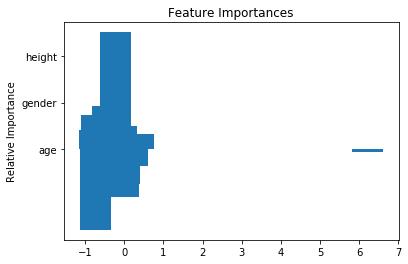

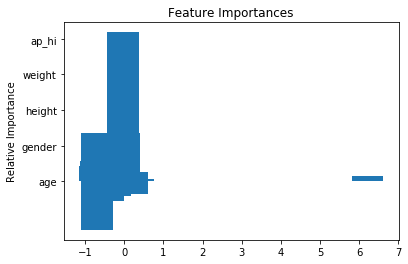

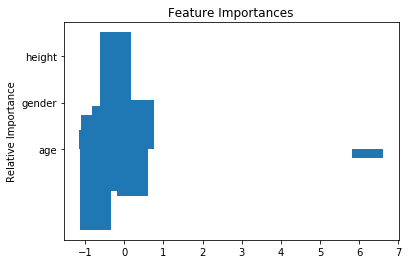

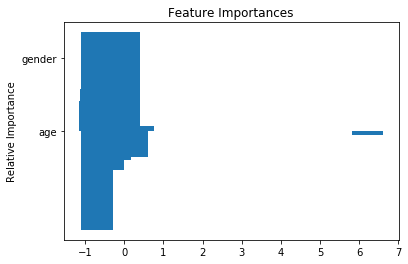

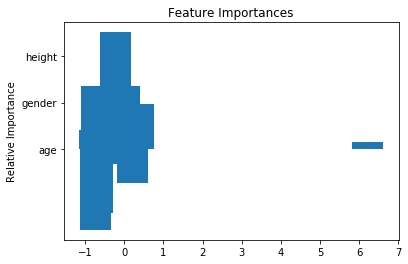

...

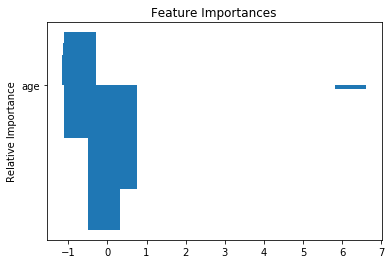

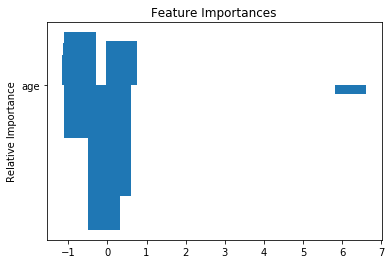

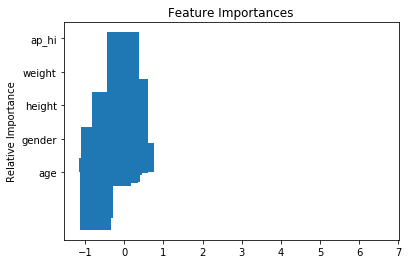

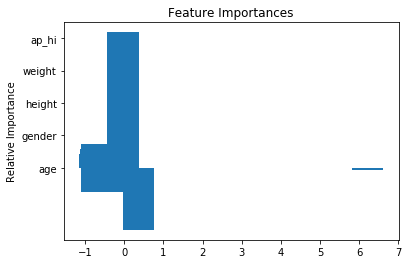

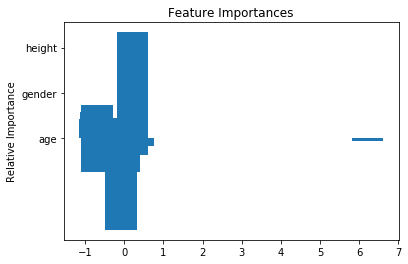

KeyboardInterrupt: 

In [20]:
logreg_fit_coefs = [3.63415466e-01, -6.99328460e-01, -3.48533626e-02,  2.07263505e-01,
            6.21821839e+00,  5.31028157e-02, -4.15269387e-01, -6.97565028e-01,
            -4.95604597e-02, -3.30619236e-02, -8.60907051e-02, -6.98842480e-01,
            -2.42990112e-04, -7.35925249e-01, -2.30422516e-01,  2.05692170e-01,
            -7.58581903e-01, -2.30052591e-01, -9.53457028e-03]

for i, train_col in enumerate(X_train):
        #i=i+1,logreg_fit_coefs
        i=logreg_fit_coefs
        plt.title('Feature Importances')
        plt.yticks(range(len(logreg_fit_coefs)), X1[:])
        plt.ylabel('Relative Importance')
        plt.bar(i,train_col)
        plt.show()

### 2.6  Accuracy & Classification Report

In [21]:
print('Accuracy Score :',accuracy_score(y_train, y_hat_train))
print('Report : ')
print(classification_report(y_train, y_hat_train))

Accuracy Score : 0.717875
Report : 
              precision    recall  f1-score   support

         0.0       0.69      0.80      0.74     28104
         1.0       0.76      0.64      0.69     27896

    accuracy                           0.72     56000
   macro avg       0.72      0.72      0.72     56000
weighted avg       0.72      0.72      0.72     56000



Our accuracy is at 72%

### 2.7 Confusion Matrix

In [22]:
#How accuarte is our confusion matrix?
svc_con_mat = confusion_matrix(y_train, y_hat_train)
svc_accuracy = accuracy_score(y_test, sup_vec_pred)
print(f'Accuracy: {svc_accuracy}')

Accuracy: 0.7271428571428571


In [23]:
print('Confusion Matrix :')
print(svc_con_mat)

Confusion Matrix :
[[22461  5643]
 [10156 17740]]


Text(69.0, 0.5, 'Truth')

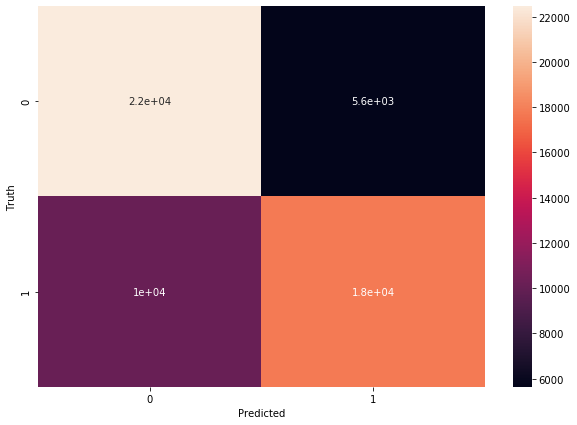

In [24]:
plt.figure(figsize = (10,7))
sns.heatmap(svc_con_mat, annot=True)
plt.xlabel('Predicted')
plt.ylabel('Truth')

### 2.8 Decision Tree

In [25]:
dtree = DecisionTreeClassifier()
dtree.fit(X_train,y_train)
y_pred = dtree.predict(X_test)
print('Accuracy of Model:', accuracy_score(y_test,y_pred))
print('Report : ')
print(classification_report(y_test, y_pred))

Accuracy of Model: 0.6372142857142857
Report : 
              precision    recall  f1-score   support

         0.0       0.63      0.65      0.64      6917
         1.0       0.64      0.63      0.64      7083

    accuracy                           0.64     14000
   macro avg       0.64      0.64      0.64     14000
weighted avg       0.64      0.64      0.64     14000



### *Decision Tree Feature Importance*

In [26]:
dtree_feat_imp = dtree.feature_importances_
dtree_feat_imp

array([0.31959482, 0.00749018, 0.14624388, 0.15513704, 0.22940587,
       0.04040047, 0.01393642, 0.00779623, 0.00953223, 0.0077151 ,
       0.01411458, 0.00645535, 0.00673176, 0.00403988, 0.00444342,
       0.01308307, 0.00549703, 0.0053449 , 0.00303776])

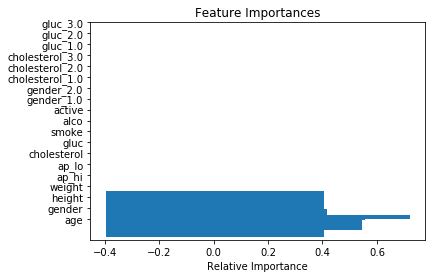

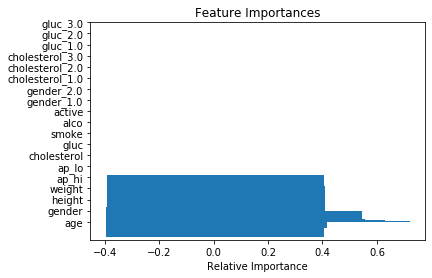

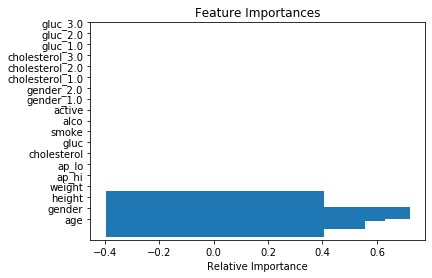

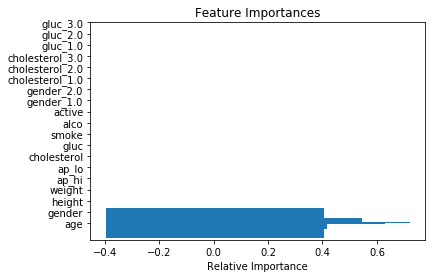

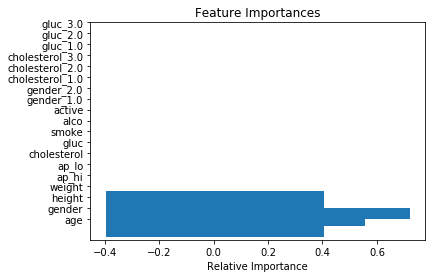

...

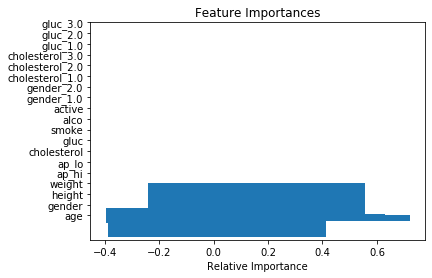

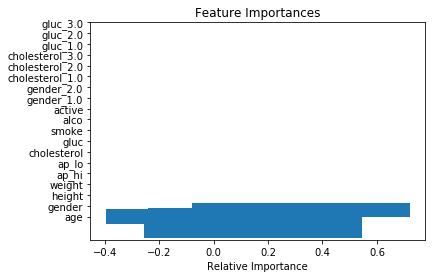

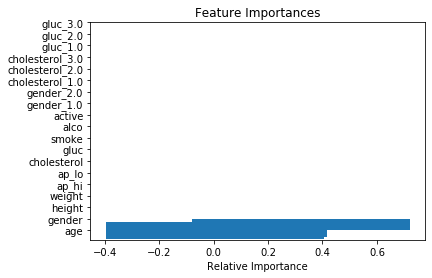

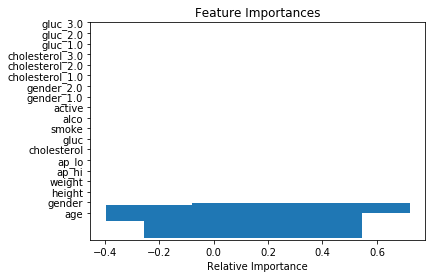

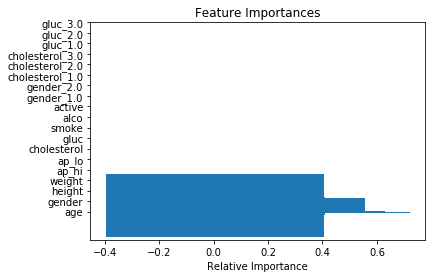

KeyboardInterrupt: 

In [27]:
dtree_coefs = [0.32120401, 0.00633588, 0.14459628, 0.15756571, 0.22915924,
       0.03928807, 0.01626051, 0.008408  , 0.00991587, 0.00725663,
       0.01405434, 0.00664027, 0.00714157, 0.00513614, 0.00480845,
       0.00852504, 0.00413731, 0.00612565, 0.00344105]

for i, train_col in enumerate(X_train):
        i=dtree_coefs

        plt.bar(i,train_col)
        plt.title('Feature Importances')
        plt.yticks(range(len(dtree_coefs)), X1[:])
        plt.xlabel('Relative Importance')
        plt.show()

### 2.9 Random Forest

In [28]:
rf = RandomForestClassifier(n_estimators=10,max_depth=4, random_state=444).fit(X1, Y1)
y_pred_rf = rf.predict(X_test)

In [29]:
print('Accuracy of Model:', (accuracy_score(y_test,y_pred_rf))*100, '%')
print('Report : ')
print(classification_report(y_test, y_pred_rf))

Accuracy of Model: 55.92857142857143 %
Report : 
              precision    recall  f1-score   support

         0.0       0.53      0.95      0.68      6917
         1.0       0.78      0.18      0.29      7083

    accuracy                           0.56     14000
   macro avg       0.65      0.56      0.49     14000
weighted avg       0.65      0.56      0.48     14000



#### 2.9.2 Feature Assessment

In [30]:
#Feature Importance
forest = ExtraTreesClassifier(n_estimators=333,
                              random_state=0)

forest.fit(X1, Y1)
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]


print("Feature ranking:")

for f in range(X1.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

Feature ranking:
1. feature 0 (0.292888)
2. feature 3 (0.181600)
3. feature 4 (0.179695)
4. feature 2 (0.168005)
5. feature 5 (0.109722)
6. feature 13 (0.015687)
7. feature 6 (0.014863)
8. feature 15 (0.012092)
9. feature 10 (0.005531)
10. feature 8 (0.004207)
11. feature 9 (0.003869)
12. feature 14 (0.003710)
13. feature 16 (0.001934)
14. feature 7 (0.001860)
15. feature 18 (0.001251)
16. feature 17 (0.001184)
17. feature 11 (0.000641)
18. feature 12 (0.000633)
19. feature 1 (0.000629)


In [31]:
plt.figure(1)
plt.title('Feature Importances')
plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.gca().invert_yaxis()
plt.yticks(range(len(indices)), X1[:])
plt.xlabel('Relative Importance')
plt.show()

Age, gender, height, and weight are the most important features of our dataset.

## 3. Model Boosting

### 3.1 GridSearchCV

With GridSearchCV, we can fine tune parameters and boost model accuracy.

In [34]:
parameters = {'max_depth':[1,2,3,4,5,6,7,8,9,10], 'n_estimators':[10,20,30,40,50,60,70,80,90,100,500,1000]}
from sklearn.model_selection import GridSearchCV
cv = GridSearchCV(rf,parameters,cv=5)

In [36]:
cv.fit(X1,Y1.values.ravel())

In [37]:
def display(results):
    print(f'Best parameters are: {results.best_params_}')
    mean_score = results.cv_results_['mean_test_score']
    std_score = results.cv_results_['std_test_score']
    params = results.cv_results_['params']
    for mean,std,params in zip(mean_score,std_score,params):
        print(f'{round(mean,3)}')
        print("\n")
        print('Mean Score::', mean_score)
        print('\n')
        print('Std::', std_score)
        display(cv)

### 3.2 Gradient Boost

In [39]:
GB_classifier = GradientBoostingClassifier()
GB_classifier.fit(X_train,y_train)

GradientBoostingClassifier(criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='auto',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)

In [41]:
y_pred_gb = GB_classifier.predict(X_test)
y_pred_gb

array([1., 0., 1., ..., 0., 0., 1.])

In [42]:
print('Accuracy Score :',accuracy_score(y_test,y_pred_gb))

Accuracy Score : 0.7383571428571428


After Gradient Boosting, our accuracy rose to 74%.

### 3.3 XG Boost

In [43]:
df_dmatrix = xgb.DMatrix(data=X1,label=Y1)

In [44]:
xg = xgb.XGBClassifier(objective ='reg:linear', colsample_bytree = 0.3, learning_rate = 0.1,
                max_depth = 5, alpha = 10, n_estimators = 1000)

In [45]:
xgb = xg.fit(X_train,y_train)
y_preds_xgb = xgb.predict(X_test)

[06:31:25] WARNING: src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


In [46]:
print('Accuracy Score :',accuracy_score(y_test,y_preds_xgb))

Accuracy Score : 0.7381428571428571


Our XG Boost also has an accuracy of 74%. It is slightly less accurate than our Gradient Boost.

## Conclusion

Overall, we used several algorithms and visualizations to maximize our model's accuracy. Ultimately, we achieved an accuracy of a about 74% which is great for our dataset. The CD Predictor models were a success!